In [134]:
# !pip install waymo-open-dataset-tf-2-11-0==1.6.1

In [135]:
# Imports
import os
import tarfile

import numpy
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import tqdm
import json

from waymo_open_dataset.wdl_limited.sim_agents_metrics import metric_features
from waymo_open_dataset.wdl_limited.sim_agents_metrics import metrics

from waymo_open_dataset.protos import scenario_pb2
from waymo_open_dataset.protos import sim_agents_submission_pb2

from waymo_open_dataset.utils.sim_agents import submission_specs
from waymo_open_dataset.utils.sim_agents import test_utils as sim_agents_test_utils
from waymo_open_dataset.utils.sim_agents import visualizations
from waymo_open_dataset.utils import trajectory_utils

# Set matplotlib to jshtml so animations work with colab.
from matplotlib import rc
rc('animation', html='jshtml')


Loading the data x


In [136]:
DATASET_FOLDER = '/home/mbultc/womd1_1/'
TRAIN_FILES = os.path.join(DATASET_FOLDER, 'training/*')
VALIDATION_FILES = os.path.join(DATASET_FOLDER, 'mini_womd1_1/validation/*')
TEST_FILES = os.path.join(DATASET_FOLDER, 'testing/*')

We create a dataset starting from the validation set, which is smaller than the training set but contains future states (which the test set does not). We need future information to demonstrate how to evaluate your submission locally.

In [137]:
# Define the dataset from the TFRecords.
filenames = tf.io.matching_files(VALIDATION_FILES)
print(filenames.shape)


(4,)


Load locally saved closed-loop trajectories. Specify refresh rate as updated_frames

In [138]:
updated_frames = 1

all_json_files_data = []
scenario_id_list = []
nested_object_ids_list = []
nested_rollouts_list = []

# Load data from the JSON file
if updated_frames == 1:
    with open("/home/mbultc/Downloads/0_to_50_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/50_to_60_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/60_to_70_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/70_to_80_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/80_to_200_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/200_to_400_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/400_to_500_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/500_to_800_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/800_to_1000_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
elif updated_frames == 2:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_2_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_400_scenarios_2_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/400_to_800_scenarios_2_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/800_to_1000_scenarios_2_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
elif updated_frames == 5:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_5_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_500_scenarios_5_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/500_to_800_scenarios_5_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/800_to_1000_scenarios_5_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
elif updated_frames == 10:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_10_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_600_scenarios_10_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/600_to_1000_scenarios_10_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
elif updated_frames == 20:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_20_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_600_scenarios_20_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/600_to_1000_scenarios_20_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
elif updated_frames == 40:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_40_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_600_scenarios_40_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/600_to_1000_scenarios_40_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
elif updated_frames == 80:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_80_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_600_scenarios_80_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))
    with open("/home/mbultc/Downloads/600_to_1000_scenarios_80_frames_single_rollout.json", "r") as json_file:
        all_json_files_data.append(json.load(json_file))


for loaded_data in all_json_files_data:
    scenario_id_list += loaded_data['scenario_ids']
    nested_object_ids_list += loaded_data['object_ids_tensors']
    nested_rollouts_list += loaded_data['closed_loop_trajs']    # Updated

object_ids_list = [tf.convert_to_tensor(nested_list, dtype=tf.int32) for nested_list in nested_object_ids_list]
rollouts_tensors_list_single_rollout = [tf.convert_to_tensor(nested_list) for nested_list in nested_rollouts_list]
rollouts_tensors_list = []
number_of_agents = []

for rollout_tensor in rollouts_tensors_list_single_rollout:
    # print(rollout_tensor.shape)
    if updated_frames != "constant velocity":
        number_of_agents.append(rollout_tensor.shape[0])
        rollout_multiplied = [rollout_tensor for _ in range(32)]
        rollouts_tensors_list.append(np.stack(rollout_multiplied))
    else:
        number_of_agents.append(rollout_tensor.shape[1])

In [139]:
updated_frames2 = 10

all_json_files_data2 = []
scenario_id_list2 = []
nested_object_ids_list2 = []
nested_rollouts_list2 = []

# Load data from the JSON file
if updated_frames2 == 1:
    with open("/home/mbultc/Downloads/0_to_50_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/50_to_60_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/60_to_70_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/70_to_80_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/80_to_200_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/200_to_400_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/400_to_500_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/500_to_800_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/800_to_1000_scenarios_1_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
elif updated_frames2 == 2:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_2_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_400_scenarios_2_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/400_to_800_scenarios_2_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/800_to_1000_scenarios_2_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
elif updated_frames2 == 5:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_5_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_500_scenarios_5_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/500_to_800_scenarios_5_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/800_to_1000_scenarios_5_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
elif updated_frames2 == 10:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_10_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_600_scenarios_10_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/600_to_1000_scenarios_10_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
elif updated_frames2 == 20:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_20_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_600_scenarios_20_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/600_to_1000_scenarios_20_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
elif updated_frames2 == 40:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_40_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_600_scenarios_40_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/600_to_1000_scenarios_40_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
elif updated_frames2 == 80:
    with open("/home/mbultc/Downloads/0_to_300_scenarios_80_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/300_to_600_scenarios_80_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))
    with open("/home/mbultc/Downloads/600_to_1000_scenarios_80_frames_single_rollout.json", "r") as json_file:
        all_json_files_data2.append(json.load(json_file))


for loaded_data in all_json_files_data2:
    scenario_id_list2 += loaded_data['scenario_ids']
    nested_object_ids_list2 += loaded_data['object_ids_tensors']
    nested_rollouts_list2 += loaded_data['closed_loop_trajs']    # Updated

object_ids_list2 = [tf.convert_to_tensor(nested_list, dtype=tf.int32) for nested_list in nested_object_ids_list2]
rollouts_tensors_list_single_rollout2 = [tf.convert_to_tensor(nested_list) for nested_list in nested_rollouts_list2]
rollouts_tensors_list2 = []
number_of_agents2 = []

for rollout_tensor in rollouts_tensors_list_single_rollout2:
    # print(rollout_tensor.shape)
    if updated_frames2 != "constant velocity":
        number_of_agents2.append(rollout_tensor.shape[0])
        rollout_multiplied = [rollout_tensor for _ in range(32)]
        rollouts_tensors_list2.append(np.stack(rollout_multiplied))
    else:
        number_of_agents2.append(rollout_tensor.shape[1])

Load one scenario with order number 1 to 1000

In [140]:
scenario_number = 23

dataset = tf.data.TFRecordDataset(filenames)
# Since these are raw Scenario protos, we need to parse them in eager mode.
dataset_iterator = dataset.as_numpy_iterator()

for _ in range(scenario_number):
    bytes_example = next(dataset_iterator)

scenario = scenario_pb2.Scenario.FromString(bytes_example)
print(f'Checking type: {type(scenario)}')
print(f'Loaded scenario with ID: {scenario.scenario_id}')

eval_tracks_and_difficulty = {
        'track_index': [cur_pred.track_index for cur_pred in scenario.tracks_to_predict],
        'difficulty': [cur_pred.difficulty for cur_pred in scenario.tracks_to_predict]
    }
print('Eval tracks and difficulty')
print(eval_tracks_and_difficulty)
print('All sim agents ids')
print(submission_specs.get_sim_agent_ids(scenario))
# These features will be computed only for the `tracks_to_predict` objects.
evaluated_objects = submission_specs.get_evaluation_sim_agent_ids(scenario)
print(f'Evaluated objects: {evaluated_objects}')

Checking type: <class 'waymo_open_dataset.protos.scenario_pb2.Scenario'>
Loaded scenario with ID: 8d76dfd3e1678f2e
Eval tracks and difficulty
{'track_index': [8], 'difficulty': [1]}
All sim agents ids
[1598, 1600, 1602, 1603, 1607, 1608, 1610, 1611, 1612, 1787]
Evaluated objects: [1612, 1787]


------------------------------
Looking at track 1598
(91,)
Path length: 0.0
1598 is stationary
------------------------------
Looking at track 1600
(91,)
Path length: 5.57029005627718
Difference between direct path and total path: 1.0833661144107007
Average residuals: 0.6745256629483365
1600 is going straight
------------------------------
Looking at track 1602
(52,)
Path length: 80.46849496726742
Difference between direct path and total path: 1.0030071026998897
Average residuals: 18.807462078470472
1602 is going straight
------------------------------
Looking at track 1603
(91,)
Path length: 0.0
1603 is stationary
------------------------------
Looking at track 1607
(91,)
Path length: 11.6272976104751
Difference between direct path and total path: 1.0241617968334344
Average residuals: 0.4790656754227642
1607 is going straight
------------------------------
Looking at track 1608
(91,)
Path length: 14.475262685000574
Difference between direct path and total path: 1.0004152566075013
Aver

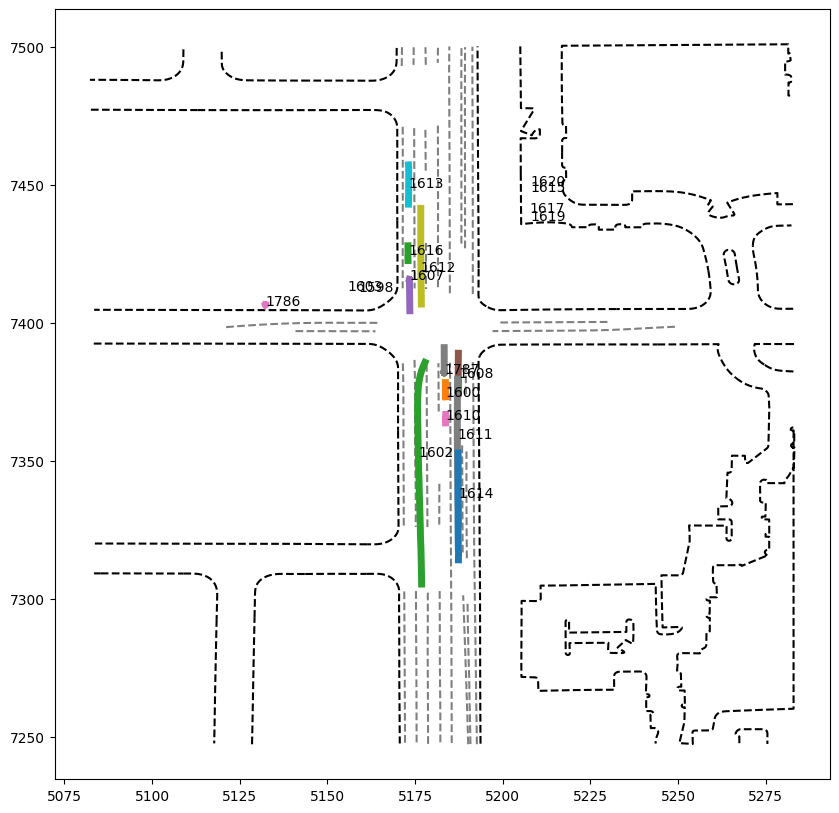

In [141]:
# Visualize scenario.
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

visualizations.add_map(ax, scenario)

from scipy.stats import linregress

def calculate_residuals(x, y):
    slope, intercept, _, _, _ = linregress(x, y)
    fitted_y = slope * np.array(x) + intercept
    residuals = np.array(y) - fitted_y
    return residuals

def calculate_path_length(x, y):
    points = np.array([x, y]).T
    path_length = np.sum(np.sqrt(np.sum(np.diff(points, axis=0)**2, axis=1)))
    direct_distance = np.sqrt((x[-1] - x[0])**2 + (y[-1] - y[0])**2)
    return path_length, direct_distance

def classify_track(track, print_verbose_comments = True):
    vprint = print if print_verbose_comments else lambda arg: None
    valids = np.array([state.valid for state in track.states])
    if np.any(valids):
        x = np.array([state.center_x for state in track.states])
        y = np.array([state.center_y for state in track.states])
        x = x[x != 0]
        y = y[y != 0]
        # print(np.stack((x, y), axis=1))
        vprint(x.shape)
        path_length, direct_distance = calculate_path_length(x, y)
        vprint(f'Path length: {path_length}')
        if path_length < 4:  # Needs to be calibrated
            return 'stationary'
        # Compare path length and direct distance
        turning1 = False
        relative_diff = path_length / direct_distance
        vprint(f'Difference between direct path and total path: {relative_diff}')
        if relative_diff > 1.04:  # Needs calibration
            turning1 = True
        # Look at average residuals
        turning2 = False
        residuals = calculate_residuals(x, y)
        avg_residuals = np.average(np.abs(residuals))
        vprint(f'Average residuals: {avg_residuals}')
        if avg_residuals > 1:   # Needs to be calibrated
            turning2 = True
        if turning1 and turning2:
            return 'turning'
        else:
            return 'going straight'
    return 'invalid'

def plot_track_trajectory(track: scenario_pb2.Track):
    valids = np.array([state.valid for state in track.states])
    if np.any(valids):
        x = np.array([state.center_x for state in track.states])
        y = np.array([state.center_y for state in track.states])
        ax.plot(x[valids], y[valids], linewidth=5)
        if len(x[valids]) > 0:
            label_position = int(len(x[valids]) / 2)  # Choose the midpoint for labeling
            ax.annotate(track.id, (x[valids][label_position], y[valids][label_position]),
                        fontsize=10, color='black')


movements = {
    'invalid': [],
    'going straight': [],
    'stationary': [],
    'turning': []
}
for track in scenario.tracks:
    movement = classify_track(track, False)
    movements[movement].append(track.id)
    if track.id not in movements['invalid']: #in evaluated_objects:
        print('------------------------------')
        print(f'Looking at track {track.id}')
        movement = classify_track(track)
        plot_track_trajectory(track)
        print(f'{track.id} is {movement}')

plt.show();
    

Objects to be resimulated: [1598, 1600, 1602, 1603, 1607, 1608, 1610, 1611, 1612, 1787]
Total objects to be resimulated: 10
------------------------------
Looking at track 1598
1598 is stationary
------------------------------
Looking at track 1600
1600 is going straight
------------------------------
Looking at track 1602
1602 is going straight
------------------------------
Looking at track 1603
1603 is stationary
------------------------------
Looking at track 1607
1607 is going straight
------------------------------
Looking at track 1608
1608 is going straight
------------------------------
Looking at track 1610
1610 is stationary
------------------------------
Looking at track 1611
1611 is going straight
------------------------------
Looking at track 1612
1612 is going straight
------------------------------
Looking at track 1787
1787 is going straight


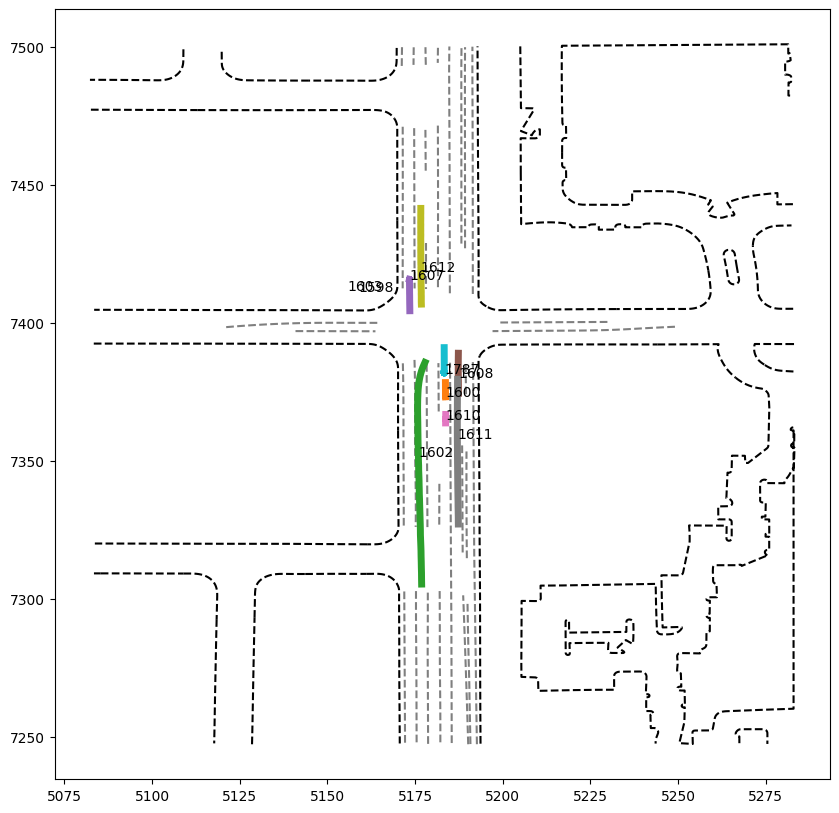

{'invalid': [], 'going straight': [1600, 1602, 1607, 1608, 1611, 1612, 1787], 'stationary': [1598, 1603, 1610], 'turning': []}
There are 0 agents who are invalid
There are 7 agents who are going straight
There are 3 agents who are stationary
There are 0 agents who are turning


In [142]:
print(f'Objects to be resimulated: {submission_specs.get_sim_agent_ids(scenario)}')
print(f'Total objects to be resimulated: {len(submission_specs.get_sim_agent_ids(scenario))}')

# Plot their tracks.
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
visualizations.add_map(ax, scenario)


movements = {
    'invalid': [],
    'going straight': [],
    'stationary': [],
    'turning': []
}
for track in scenario.tracks:
  if track.id in submission_specs.get_sim_agent_ids(scenario):
    movement = classify_track(track, False)
    movements[movement].append(track.id)
    if track.id not in movements['invalid']:
        print('------------------------------')
        print(f'Looking at track {track.id}')
        
        plot_track_trajectory(track)
        print(f'{track.id} is {movement}')

plt.show();
print(movements)
for movement, _ in movements.items():
    print(f'There are {len(movements[movement])} agents who are {movement}')

Defining the constant velocity + gaussian noise function below. To visualize constant velocity policy, comment out the last line in this box


In [143]:
def simulate_with_extrapolation(
    scenario: scenario_pb2.Scenario,
    print_verbose_comments: bool = True) -> tf.Tensor:
  vprint = print if print_verbose_comments else lambda arg: None

  # To load the data, we create a simple tensorized version of the object tracks.
  logged_trajectories = trajectory_utils.ObjectTrajectories.from_scenario(scenario)
  # Using `ObjectTrajectories` we can select just the objects that we need to
  # simulate and remove the "future" part of the Scenario.
  vprint(f'Original shape of tensors inside trajectories: {logged_trajectories.valid.shape} (n_objects, n_steps)')
  logged_trajectories = logged_trajectories.gather_objects_by_id(
      tf.convert_to_tensor(submission_specs.get_sim_agent_ids(scenario)))
  logged_trajectories = logged_trajectories.slice_time(
      start_index=0, end_index=submission_specs.CURRENT_TIME_INDEX + 1)
  vprint(f'Modified shape of tensors inside trajectories: {logged_trajectories.valid.shape} (n_objects, n_steps)')

  # We can verify that all of these objects are valid at the last step.
  vprint(f'Are all agents valid: {tf.reduce_all(logged_trajectories.valid[:, -1]).numpy()}')

  # We extract the speed of the sim agents (in the x/y/z components) ready for
  # extrapolation (this will be our policy).
  states = tf.stack([logged_trajectories.x, logged_trajectories.y,
                    logged_trajectories.z, logged_trajectories.heading],
                    axis=-1)
  n_objects, n_steps, _ = states.shape
  # print(states[:3, -1, :])
  # print(states[0, -1, :3])
  last_velocities = states[:, -1, :3] - states[:, -2, :3]
  
  
  #print(last_velocities)
  # We also make the heading constant, so concatenate 0. as angular speed.
  last_velocities = tf.concat(
      [last_velocities, tf.zeros((n_objects, 1))], axis=-1)
  # It can happen that the second to last state of these sim agents might be
  # invalid, so we will set a zero speed for them.
  vprint(f'Is any 2nd to last state invalid: {tf.reduce_any(tf.logical_not(logged_trajectories.valid[:, -2]))}')
  vprint(f'This will result in either min or max speed to be really large: {tf.reduce_max(tf.abs(last_velocities))}')
  valid_diff = tf.logical_and(logged_trajectories.valid[:, -1],
                              logged_trajectories.valid[:, -2])
  # `last_velocities` shape: (n_objects, 4).
  last_velocities = tf.where(valid_diff[:, tf.newaxis],
                            last_velocities,
                            tf.zeros_like(last_velocities))
  vprint(f'Now this should be back to a normal value: {tf.reduce_max(tf.abs(last_velocities))}')

  # Now we carry over a simulation. As we discussed, we actually want 32 parallel
  # simulations, so we make this batched from the very beginning. We add some
  # random noise on top of our actions to make sure the behaviours are different.
  # To properly scale the noise, we get the max velocities (average over all
  # objects, corresponding to axis 0) in each of the dimensions (x/y/z/heading).
  NOISE_SCALE = 0.01
  # `max_action` shape: (4,).
  max_action = tf.reduce_max(last_velocities, axis=0)
  # We create `simulated_states` with shape (n_rollouts, n_objects, n_steps, 4).
  simulated_states = tf.tile(states[tf.newaxis, :, -1:, :], [submission_specs.N_ROLLOUTS, 1, 1, 1])
  vprint(f'Shape: {simulated_states.shape}')

  for step in range(submission_specs.N_SIMULATION_STEPS):
    current_state = simulated_states[:, :, -1, :]
    # Random actions, take a normal and normalize by min/max actions
    action_noise = tf.random.normal(
        current_state.shape, mean=0.0, stddev=NOISE_SCALE)
    actions_with_noise = last_velocities[None, :, :] + (action_noise * max_action)
    next_state = current_state + actions_with_noise
    simulated_states = tf.concat(
        [simulated_states, next_state[:, :, None, :]], axis=2)

  # We also need to remove the first time step from `simulated_states` (it was
  # still history).
  # `simulated_states` shape before: (n_rollouts, n_objects, 81, 4).
  # `simulated_states` shape after: (n_rollouts, n_objects, 80, 4).
  simulated_states = simulated_states[:, :, 1:, :]
  vprint(f'Final simulated states shape: {simulated_states.shape}')

  return logged_trajectories, simulated_states

logged_trajectories, simulated_states = simulate_with_extrapolation(
    scenario, print_verbose_comments=False)

# For constant velocity policy, comment out line below
simulated_states = rollouts_tensors_list[scenario_number-1]
simulated_states2 = rollouts_tensors_list2[scenario_number-1]

### Visualize the simulated trajectories

In [144]:
from matplotlib import animation
from matplotlib import patches
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

from waymo_open_dataset.protos import map_pb2
from waymo_open_dataset.protos import scenario_pb2

# ==== CONSTANTS ====
_ROAD_EDGE_COLOR = 'k--'
_ROAD_EDGE_ALPHA = 1.0
_ROAD_LINE_COLOR = 'k--'
_ROAD_LINE_ALPHA = 0.5

_BBOX_ALPHA = 0.5

WAYMO_COLORS = np.array([
    [0., 120., 255.],    # Waymo Blue
    [0., 232., 157.],    # Waymo Green
    [255., 205., 85.],   # Amber
    [244., 175., 145.],  # Coral
    [145., 80., 200.],   # Purple
    [0., 51., 102.],     # Navy
]) / 255.

# Interval between each frame in an animation. This effectively plays back the
# 10Hz data at 1x speed.
_ANIMATION_INTERVAL_MS = 100


def add_map(axis: plt.Axes,
            scenario: scenario_pb2.Scenario) -> None:
  """Adds the supported map features to a pyplot axis."""
  for map_feature in scenario.map_features:
    if map_feature.WhichOneof('feature_data') == 'road_edge':
      add_road_edge(axis, map_feature.road_edge)
    elif map_feature.WhichOneof('feature_data') == 'road_line':
      add_road_line(axis, map_feature.road_line)
    else:
      # Skip other features.
      pass


def add_road_edge(axis: plt.Axes, road_edge: map_pb2.RoadEdge) -> None:
  """Adds a road edge to a pyplot axis."""
  x, y = zip(*[(p.x, p.y) for p in road_edge.polyline])
  axis.plot(x, y, _ROAD_EDGE_COLOR, alpha=_ROAD_EDGE_ALPHA)


def add_road_line(axis: plt.Axes, road_line: map_pb2.RoadLine) -> None:
  """Adds a road line to a pyplot axis."""
  x, y = zip(*[(p.x, p.y) for p in road_line.polyline])
  axis.plot(x, y, _ROAD_LINE_COLOR, alpha=_ROAD_LINE_ALPHA)


def get_bbox_patch(
    x: float, y: float, bbox_yaw: float, length: float, width: float,
    color_idx: int = 0) -> patches.Rectangle:
  """Creates a pyplot rectangle Patch for the given bounding box.

  Args:
    x: The x-coordinate of the box's center.
    y: The y-coordinate of the box's center.
    bbox_yaw: The yaw of the bounding box, with the same specification as the
      Scenario protos in the dataset.
    length: Length of the bounding box, in meters.
    width: Width of the bounding box, in meters.
    color_idx: Index of the color for the bounding box, assigned from the
      `WAYMO_COLORS` palette.

  Returns:
    A rectangular patch to be added to a pyplot figure.
  """
  # Pyplot uses the left-rear corner of the box as a reference, so we first
  # define that in the object's reference frame.
  left_rear_object = np.array([-length / 2, -width / 2])
  # Rotate this point in the object's reference frame based on the yaw.
  rotation_matrix = np.array([[np.cos(bbox_yaw), -np.sin(bbox_yaw)],
                              [np.sin(bbox_yaw), np.cos(bbox_yaw)]])
  left_rear_rotated = rotation_matrix.dot(left_rear_object)
  # Lastly, translate to the box center in the global reference frame.
  left_rear_global = np.array([x, y]) + left_rear_rotated
  # Set the color from the palette. This is an RGBA value.
  color = list(WAYMO_COLORS[color_idx]) + [_BBOX_ALPHA]
  rect = patches.Rectangle(
      left_rear_global, length, width, angle=np.rad2deg(bbox_yaw), color=color)
  return rect


def add_all_current_objects(
    axis: plt.Axes, x: tf.Tensor, y: tf.Tensor, yaw: tf.Tensor,
    length: tf.Tensor, width: tf.Tensor, color_idx: tf.Tensor
    ) -> list[patches.Rectangle]:
  """Draws all bounding boxes at a given timestep.

  Args:
    axis: The pyplot axis to which bounding boxes are added.
    x: Array of shape (num_objects,) of x-coordinates.
    y: Array of shape (num_objects,) of y-coordinates.
    yaw: Array of shape (num_objects,) of bounding box yaws.
    length: Array of shape (num_objects,) of object lengths.
    width: Array of shape (num_objects,) of object width.
    color_idx: Array of shape (num_objects,) of color indices, picked from the
      `WAYMO_COLORS` palette.

  Returns:
    A list of Rectangle patches.
  """
  bboxes = []
  for i in range(x.shape[0]):
    bboxes.append(axis.add_patch(get_bbox_patch(
        x[i], y[i], yaw[i], length[i], width[i], color_idx[i])))
  return bboxes

def get_animated_states(
    fig: plt.Figure, axis: plt.Axes, scenario: scenario_pb2.Scenario,
    x: tf.Tensor, y: tf.Tensor, yaw: tf.Tensor, axis2: plt.Axes,
    x2: tf.Tensor, y2: tf.Tensor, yaw2: tf.Tensor, length: tf.Tensor,
    width: tf.Tensor, color_idx: tf.Tensor) -> animation.FuncAnimation:
  """Animates the states in a pyplot figure.

  Args:
    fig: The pyplot figure to animate.
    axis: The pyplot axis to which bounding boxes and map are added.
    scenario: The Scenario proto from which the map is extracted.
    x: Array of shape (num_objects, num_steps) of x-coordinates.
    y: Array of shape (num_objects, num_steps) of y-coordinates.
    yaw: Array of shape (num_objects, num_steps) of bounding box yaws.
    length: Array of shape (num_objects, num_steps) of object lengths.
    width: Array of shape (num_objects, num_steps) of object width.
    color_idx: Array of shape (num_objects, num_steps) of color indices, picked
      from the `WAYMO_COLORS` palette.

  Returns:
    An animation of the object states over the static map.
  """
  # To avoid a double figure (one static and one animated), we need to first
  # close the existing pyplot figure.
  plt.close(fig)

  # Add the static map features to the animation.
  add_map(axis, scenario)
  add_map(axis2, scenario)
  

  def animate(t: int) -> list[patches.Rectangle]:
    # At each animation step, we need to remove the existing patches. This can
    # only be done using the `pop()` operation.
    for _ in range(len(axis.patches)):
      axis.patches.pop()
      axis2.patches.pop()
    bboxes = add_all_current_objects(
        axis=axis, x=x[:, t], y=y[:, t], yaw=yaw[:, t], length=length[:, t],
        width=width[:, t], color_idx=color_idx[:, t])
    bboxes2 = add_all_current_objects(
        axis=axis2, x=x2[:, t], y=y2[:, t], yaw=yaw2[:, t], length=length[:, t],
        width=width[:, t], color_idx=color_idx[:, t])
    return bboxes + bboxes2

  return animation.FuncAnimation(
      fig, animate, frames=x.shape[1], interval=_ANIMATION_INTERVAL_MS,
      blit=True)


In [145]:
# Select which how the 32 simulations we want visualize.
SAMPLE_INDEX = 0
# We need to extract box sizes (length and width) for all the simulated objects,
# from the 11th step (when one-indexed) of the original scenario.
# Also broadcast in time to be compatible with the other tensors,
# shape (num_objects, num_steps).
n_objects = logged_trajectories.valid.shape[0]
print(n_objects)
lengths = tf.broadcast_to(
    logged_trajectories.length[:, 10, tf.newaxis], 
    (n_objects, submission_specs.N_SIMULATION_STEPS))
widths = tf.broadcast_to(
    logged_trajectories.width[:, 10, tf.newaxis],
    (n_objects, submission_specs.N_SIMULATION_STEPS))
print(scenario.scenario_id)
print(lengths.shape)
print(widths.shape)
print(simulated_states.shape)

# fig, ax = plt.subplots(1, 1, figsize=(7, 7))
fig, (ax, ax2) = plt.subplots(1, 2, figsize=(12, 6))
get_animated_states(
    fig, ax, scenario, simulated_states[0, :, :, 0],
    simulated_states[0, :, :, 1], simulated_states[0, :, :, 3], ax2, simulated_states2[0, :, :, 0],
    simulated_states2[0, :, :, 1], simulated_states2[0, :, :, 3], lengths, widths,
    color_idx=tf.zeros((n_objects, 80), dtype=tf.int32))

10
8d76dfd3e1678f2e
(10, 80)
(10, 80)
(32, 10, 80, 4)


## Submission generation
To package these simulation for submissions, we are going to save them in the proto format defined inside `sim_agents_submission_pb2`.

More specifically:
- `SimulatedTrajectory` contains **one** trajectory for a single object, with the fields we need to simulate (x, y, z, heading).
- `JointScene` is a set of all the object trajectories from a **single** simulation, describing one of the possible rollouts.
- `ScenarioRollouts` is a collection of all the parallel simulations for a single initial Scenario.
- `SimAgentsChallengeSubmission` is used to package submissions for multiple Scenarios (e.g. for the whole testing dataset).

The simulation we performed above, for example, needs to be packaged inside a `ScenarioRollouts` message. Let's see how it's done.

*Note: We also provide helper functions inside* `submission_specs.py` *to validate the submission protos.*

In [130]:
def joint_scene_from_states(
    states: tf.Tensor, object_ids: tf.Tensor
    ) -> sim_agents_submission_pb2.JointScene:
  # States shape: (num_objects, num_steps, 4).
  # Objects IDs shape: (num_objects,).
  # states = states.numpy()
  simulated_trajectories = []
  for i_object in range(len(object_ids)):
    simulated_trajectories.append(sim_agents_submission_pb2.SimulatedTrajectory(
        center_x=states[i_object, :, 0], center_y=states[i_object, :, 1],
        center_z=states[i_object, :, 2], heading=states[i_object, :, 3],
        object_id=object_ids[i_object]
    ))
  return sim_agents_submission_pb2.JointScene(
      simulated_trajectories=simulated_trajectories)

# Package the first simulation into a `JointScene`
joint_scene = joint_scene_from_states(simulated_states[0, :, :, :],
                                      logged_trajectories.object_id)
# Validate the joint scene. Should raise an exception if it's invalid.
submission_specs.validate_joint_scene(joint_scene, scenario)


# Now we can replicate this strategy to export all the parallel simulations.
def scenario_rollouts_from_states(
    scenario: scenario_pb2.Scenario,
    states: tf.Tensor, object_ids: tf.Tensor
    ) -> sim_agents_submission_pb2.ScenarioRollouts:
  # States shape: (num_rollouts, num_objects, num_steps, 4).
  # Objects IDs shape: (num_objects,).
  joint_scenes = []
  for i_rollout in range(states.shape[0]):
    joint_scenes.append(joint_scene_from_states(states[i_rollout], object_ids))
  return sim_agents_submission_pb2.ScenarioRollouts(
      # Note: remember to include the Scenario ID in the proto message.
      joint_scenes=joint_scenes, scenario_id=scenario.scenario_id)



scenario_rollouts = scenario_rollouts_from_states(
    scenario, simulated_states, logged_trajectories.object_id)
print(logged_trajectories.object_id.shape)
# As before, we can validate the message we just generate.
submission_specs.validate_scenario_rollouts(scenario_rollouts, scenario)

(71,)


## Evaluation
Once we have created the submission for a single Scenario, we can evaluate the simulations we have performed.

The evaluation of sim agents is trying to capture distributional realism, i.e. how well our simulations capture the distribution of human behaviour from the real world. A key difference to the existing Behaviour Prediction task, is that we are focusing our comparison on quantities (**features**) that try to capture the behaviour of humans.

More specifically, for this challenge we will look at the following features:
- Kinematic features: speed / accelerations of objects, both linear and angular.
- Interactive features: features capturing relationships between objects, like collisions, distances to other objects and time to collision (TTC).
- Map-based features: features capturing how objects move with respect to the road itself, e.g. going offroad for a car.

While we require all those objects to be simulated, we are going to evaluate only a subset of them, namely the `tracks_to_predict` inside the Scenario. This criteria was put in place to ensure less noisy measures, as these objects will have consistently long observations from the real world, which we need to properly evaluate our agents.

Note that, while all the other sim agents are not *directly* evaluated, they are still part of the simulation. This means that all the interactive features will be computed considering those sim agents, and the *evaluated* sim agents needs to be reactive to these objects.

Now let's compute the features to understand better the evaluation in practice. Everything is included inside `metric_features.py`.

In [131]:
# Compute the features for a single JointScene.
single_scene_features = metric_features.compute_metric_features(
    scenario, joint_scene)

Evaluated objects: [1351, 1356, 1365, 1368, 1369, 1401, 2007, 2009, 2080]
Evaluated objects in features: [1351 1356 1365 1368 1369 1401 2007 2009 2080]
Are all agents valid: True
ADE: 11.610926628112793

============ KINEMATIC FEATURES ============


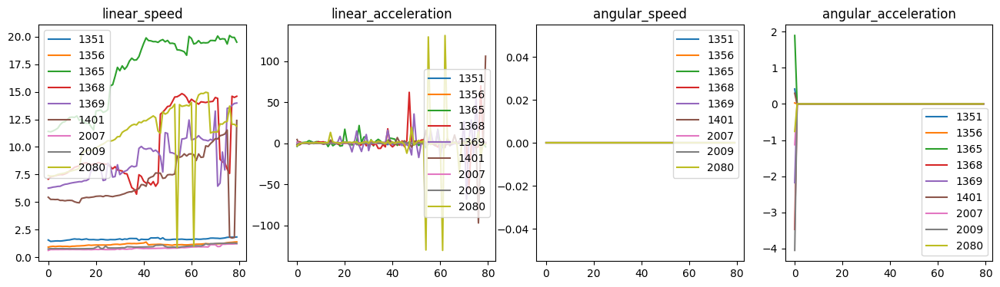


============ INTERACTIVE FEATURES ============


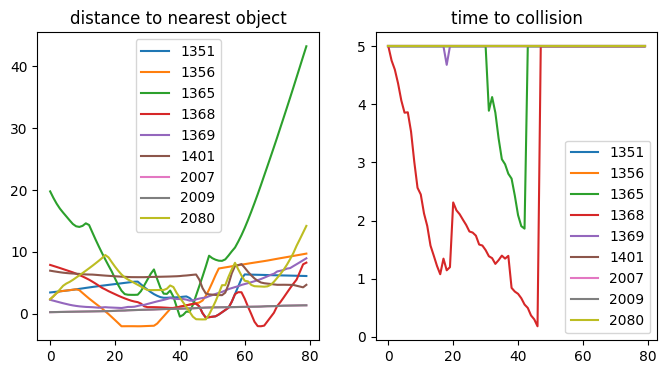


============ MAP-BASED FEATURES ============


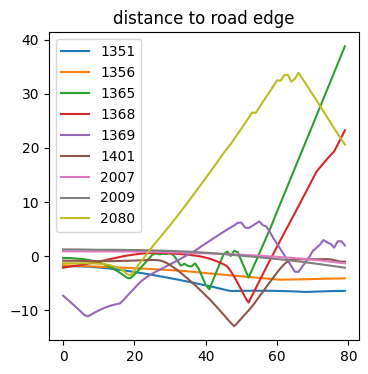

In [132]:
# These features will be computed only for the `tracks_to_predict` objects.
print(f'Evaluated objects: {submission_specs.get_evaluation_sim_agent_ids(scenario)}')
# This will also match single_scene_features.object_ids
print(f'Evaluated objects in features: {single_scene_features.object_id}')

# Features contain a validity flag, which for simulated rollouts must be always
# True, because we are requiring the sim agents to be always valid when replaced.
print(f'Are all agents valid: {tf.reduce_all(single_scene_features.valid)}')

# ============ FEATURES ============ 
# Average displacement feature. This corresponds to ADE in the BP challenges,
# here is used just as a comparison (it's not actually included in the final score).
# Shape: (1, n_objects).
print(f'ADE: {tf.reduce_mean(single_scene_features.average_displacement_error)}')

# Kinematic features.
print('\n============ KINEMATIC FEATURES ============')
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
for i_object in range(len(single_scene_features.object_id)):
  _object_id = single_scene_features.object_id[i_object].numpy()
  axes[0].plot(single_scene_features.linear_speed[0, i_object, :], label=str(_object_id))
  axes[1].plot(single_scene_features.linear_acceleration[0, i_object, :], label=str(_object_id))
  axes[2].plot(single_scene_features.angular_speed[0, i_object, :], label=str(_object_id))
  axes[3].plot(single_scene_features.angular_acceleration[0, i_object, :], label=str(_object_id))


TITLES = ['linear_speed', 'linear_acceleration', 'angular_speed', 'angular_acceleration']
for ax, title in zip(axes, TITLES):
  ax.legend()
  ax.set_title(title)
plt.show()

# Interactive features.
print('\n============ INTERACTIVE FEATURES ============')
# print(f'Colliding objects: {single_scene_features.collision_indication[0]}')
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
for i_object in range(len(single_scene_features.object_id)):
  _object_id = single_scene_features.object_id[i_object].numpy()
  axes[0].plot(single_scene_features.distance_to_nearest_object[0, i_object, :], label=str(_object_id))
  axes[1].plot(single_scene_features.time_to_collision[0, i_object, :], label=str(_object_id))

TITLES = ['distance to nearest object', 'time to collision']
for ax, title in zip(axes, TITLES):
  ax.legend()
  ax.set_title(title)
plt.show()

# Map-based features.
print('\n============ MAP-BASED FEATURES ============')
# print(f'Offroad objects: {single_scene_features.offroad_indication[0]}')
fig, axes = plt.subplots(1, 1, figsize=(4, 4))
for i_object in range(len(single_scene_features.object_id)):
  _object_id = single_scene_features.object_id[i_object].numpy()
  axes.plot(single_scene_features.distance_to_road_edge[0, i_object, :], label=str(_object_id))
axes.legend()
axes.set_title('distance to road edge')

plt.show();

These features are computed for each of the submitted `JointScenes`. So, for a given `ScenarioRollouts` we actually get a distribution of these features over the parallel rollouts.

The final metric we will be evaluating is a measure of the likelihood of what happened in real life, compared to the distribution of what *we predicted might have happened* (in simulation). For more details see the challenge documentation.

The final metrics can be called directly from `metrics.py`, as shown below. 

Some of the details of how these metrics are computed and aggregated can be found in `SimAgentMetricsConfig`. The following code demonstrates how to load the config used for the challenge and how to score your own submission.

In [133]:
from google.protobuf import text_format
from waymo_open_dataset.protos import sim_agents_metrics_pb2


def load_metrics_config() -> sim_agents_metrics_pb2.SimAgentMetricsConfig:
  """Loads the `SimAgentMetricsConfig` used for the challenge."""
  # pylint: disable=line-too-long
  # pyformat: disable
  config_path = '/home/mbultc/PycharmProjects/Thesis/waymo-open-dataset/src/waymo_open_dataset/wdl_limited/sim_agents_metrics/challenge_config.textproto'
  with open(config_path, 'r') as f:
    config = sim_agents_metrics_pb2.SimAgentMetricsConfig()
    text_format.Parse(f.read(), config)
  return config


# Load the test configuration.
config = load_metrics_config()

scenario_metrics = metrics.compute_scenario_metrics_for_bundle(
    config, scenario, scenario_rollouts)
print(scenario_metrics)

scenario_id: "50e4d7bdfe6c1b42"
metametric: 0.11403864622116089
average_displacement_error: 11.610926628112793
linear_speed_likelihood: 0.038427792489528656
linear_acceleration_likelihood: 0.10844769328832626
angular_speed_likelihood: 0.012426331639289856
angular_acceleration_likelihood: 0.02927909791469574
distance_to_nearest_object_likelihood: 0.289458692073822
collision_indication_likelihood: 0.00031330701312981546
time_to_collision_likelihood: 0.3410806655883789
distance_to_road_edge_likelihood: 0.4274551272392273
offroad_indication_likelihood: 0.009946982376277447
min_average_displacement_error: 11.610926628112793


As you can see, there is a score in the range [0,1] for each of the features listed above.
The new field to highlight is `metametric`: this is a linear combination of the
per-feature scores, and it's the final metric used to score and rank submissions.